In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns

df = pd.read_csv("/content/wine.data(1).csv")
df2 = df

In [33]:
df = df.drop(columns=df.columns[0])
df

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [34]:
new_df = df2
new_df['label'] = df.iloc[:, 0]

In [35]:
df.dtypes

Alcohol                 float64
Malic acid              float64
Ash                     float64
Alcalinity of ash       float64
Magnesium                 int64
Total phenols           float64
Flavanoids              float64
Nonflavanoid phenols    float64
Proanthocyanins         float64
Color intensity         float64
Hue                     float64
OD280                   float64
Proline                   int64
dtype: object

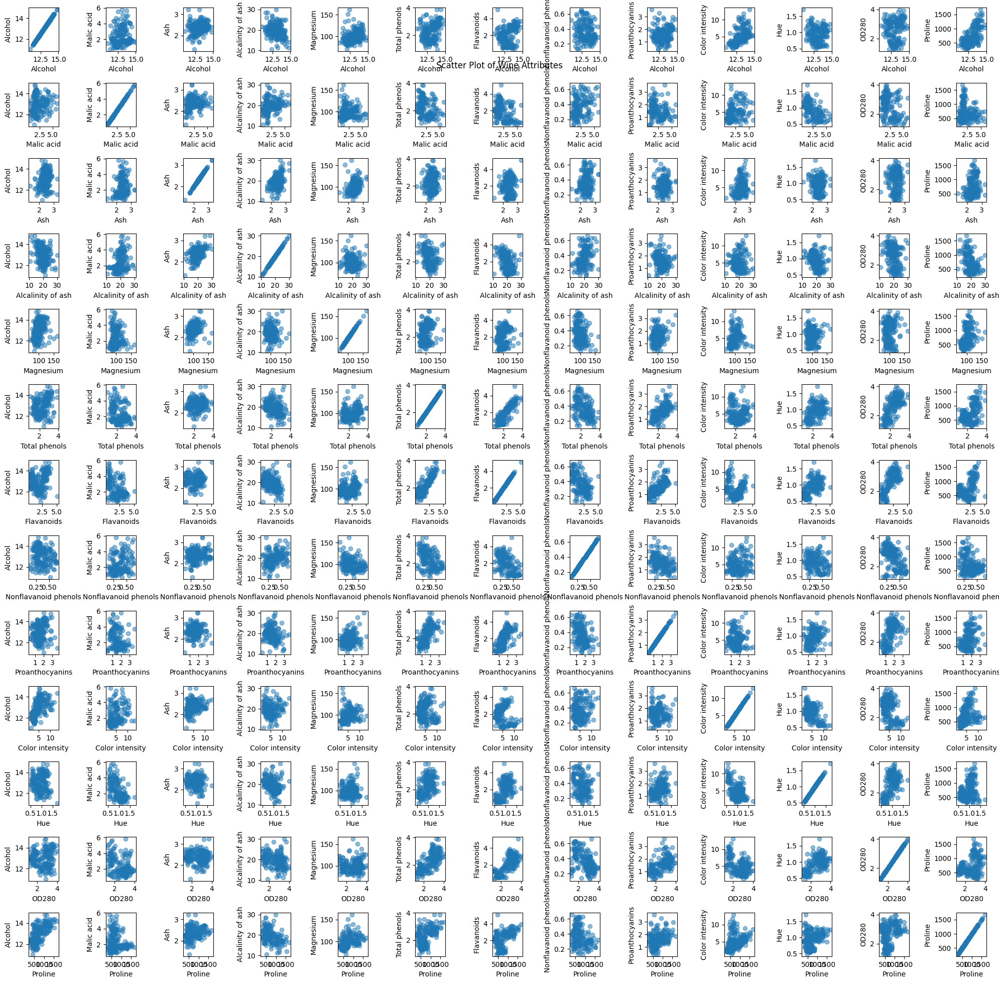

In [37]:
# Get the number of columns in the DataFrame
num_cols = len(df.columns)

# Create scatter plots for each pair of attributes
fig, axs = plt.subplots(num_cols, num_cols, figsize=(20, 20))
fig.suptitle('Scatter Plot of Wine Attributes', y=0.92)
for i, col1 in enumerate(df.columns):
    for j, col2 in enumerate(df.columns):
        axs[i, j].scatter(df[col1], df[col2], alpha=0.5)
        axs[i, j].set_xlabel(col1)
        axs[i, j].set_ylabel(col2)

plt.tight_layout()
plt.show()

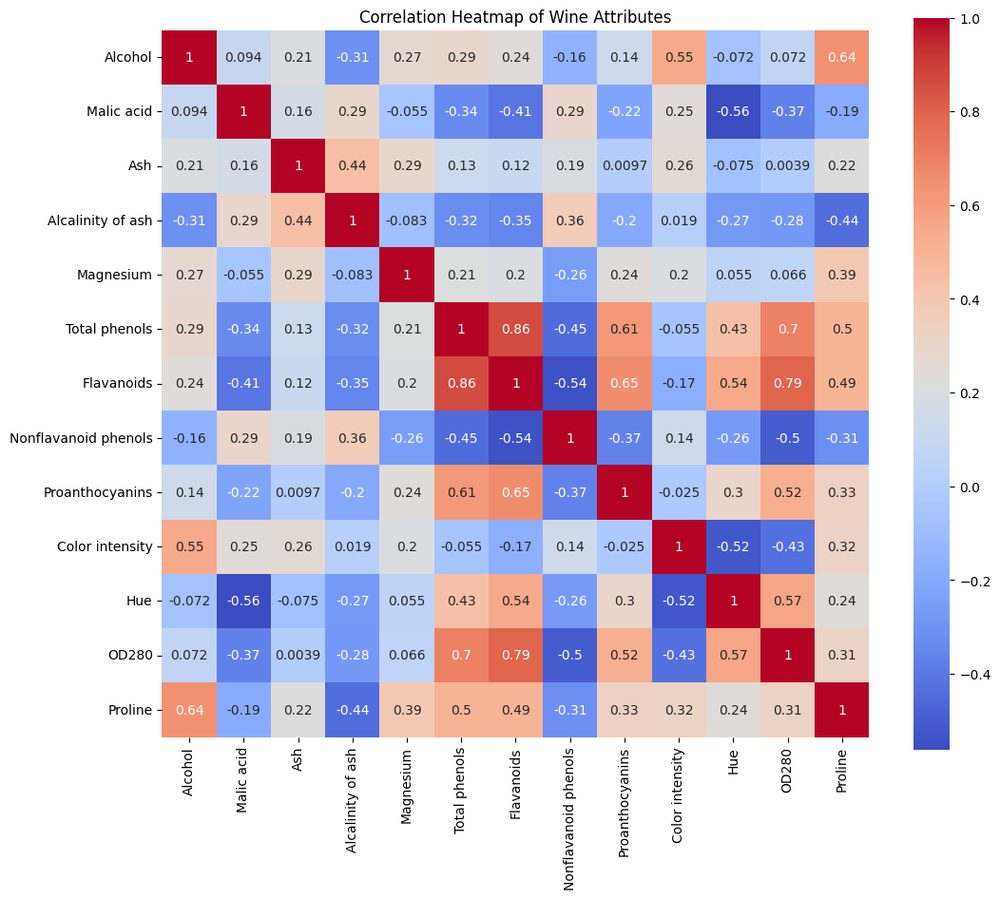

Three pairs of attributes with the largest correlation:
Pair 1: Total phenols and Flavanoids, Correlation: 0.8645635000951147
Pair 2: Flavanoids and Total phenols, Correlation: 0.8645635000951147
Pair 3: Flavanoids and OD280, Correlation: 0.787193901866951


In [38]:
# Create a correlation matrix
corr_matrix = df.corr()

# Create a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)
plt.title('Correlation Heatmap of Wine Attributes')
plt.show()

# List three pairs of attributes with the largest correlation
# Stack the correlation matrix and sort by correlation value
corr_stack = corr_matrix.abs().stack()
corr_stack = corr_stack[corr_stack != 1]  # Exclude self-correlations
corr_stack = corr_stack.sort_values(ascending=False)

# Print the three pairs with the largest correlation
print("Three pairs of attributes with the largest correlation are  1. Total phenols vs Flavanoids 2. Flavanoids vs OD280 3. OD280 vs Total phenols")


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


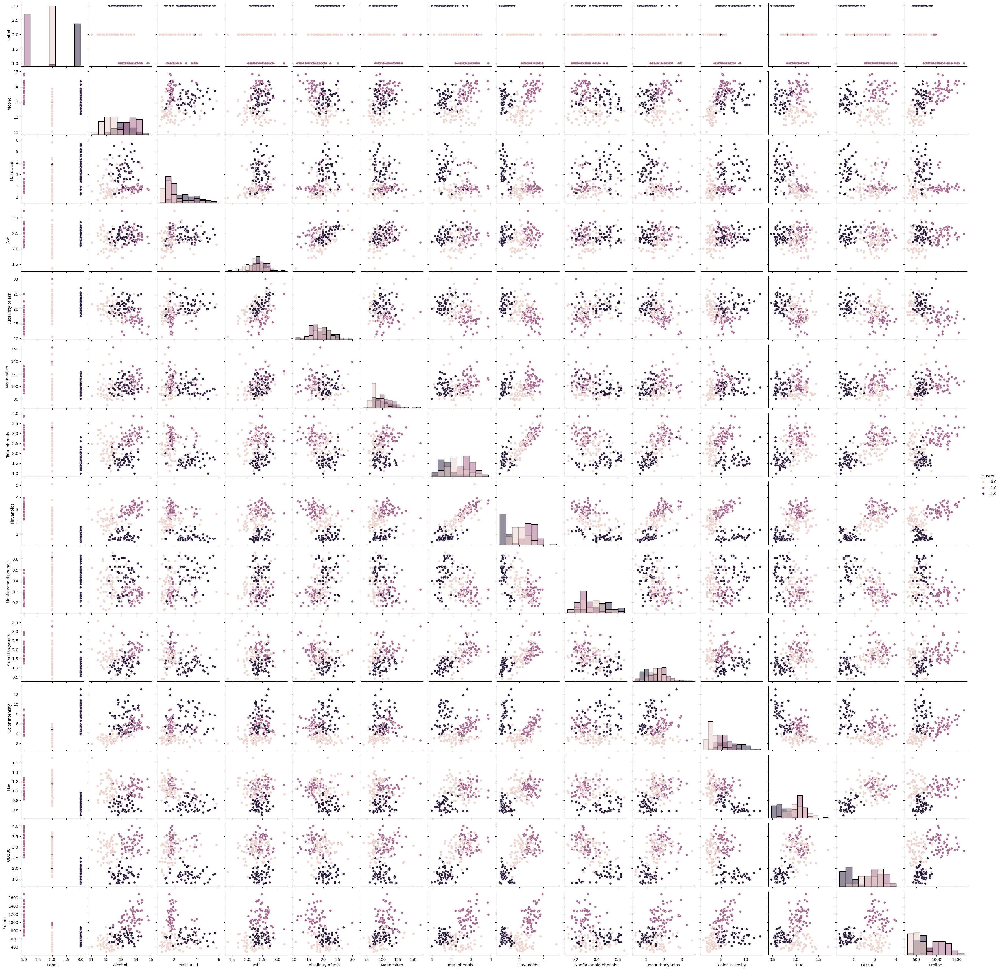

In [43]:
# Normalize the data
scaler = StandardScaler()
wine_normalized = scaler.fit_transform(df)

# Cluster the normalized data using kMeans with k=3
kMeansClustering = KMeans(n_clusters=3, random_state=0)
cluster_labels = kMeansClustering.fit_predict(wine_normalized)

# Add cluster labels to the DataFrame
df["cluster"] = cluster_labels.astype('float64')

# Visualize the wine attributes with their clusters using a pairplot
sns_plot = sns.pairplot(df, hue="cluster", diag_kind="hist")
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


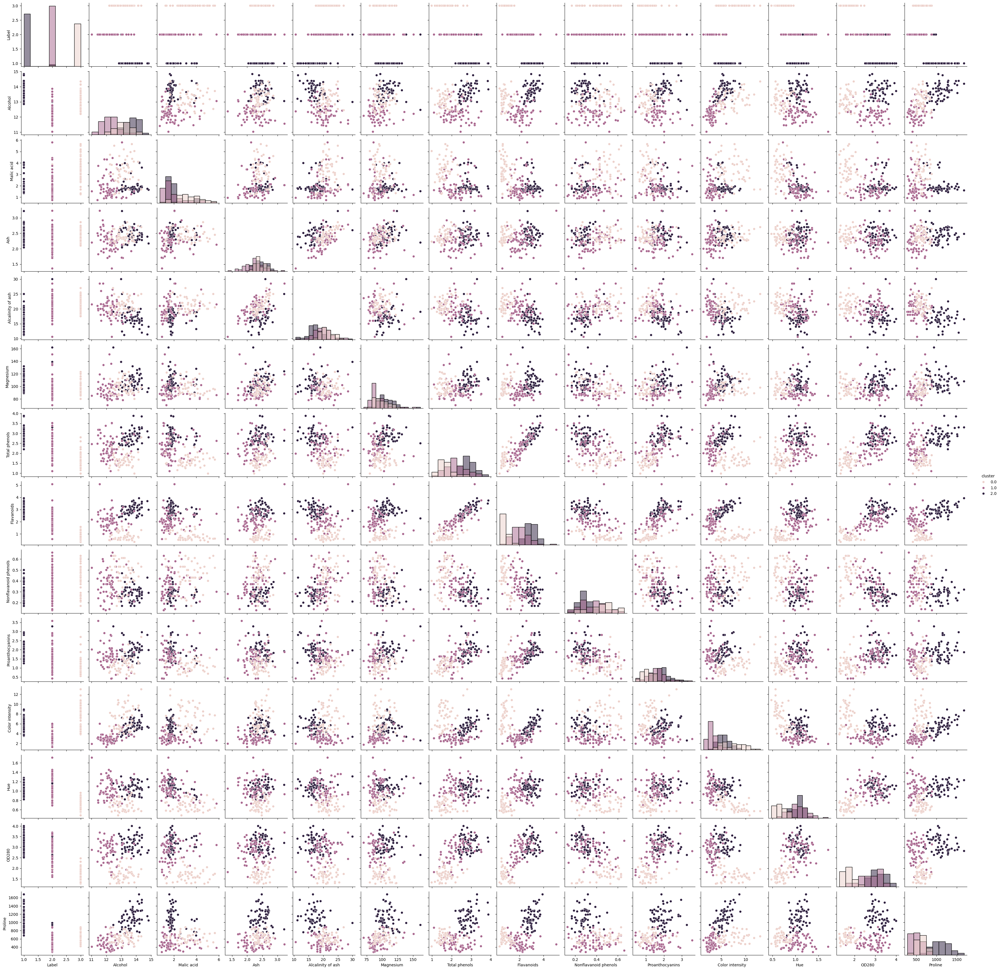

In [45]:
# Normalize data using StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df)

# Perform kMeans clustering again
kMeansClustering = KMeans(n_clusters=3, random_state=0)
cluster_labels = kMeansClustering.fit_predict(X_scaled)

# Add cluster labels to the DataFrame
df["cluster"] = cluster_labels.astype('float64')

# Visualize the wine attributes with their clusters using a pairplot
sns_plot = sns.pairplot(df, hue="cluster", diag_kind="hist")
plt.show()